# Pkgs & Libs

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
import pandas as pd
import datetime
import os
import getpass
from pathlib import Path
import pandas as pd
import json
import xml.etree.ElementTree as ET
from utils import *

* import sentinelhub packages

In [2]:
from sentinelhub import (
    SHConfig,
    CRS,
    BBox,
    DataCollection,
    DownloadRequest,
    MimeType,
    MosaickingOrder,
    SentinelHubDownloadClient,
    SentinelHubRequest,
    bbox_to_dimensions,
)

SHConfig.get_config_location()

'/Users/yanwang/.config/sentinelhub/config.toml'

Config the API

In [3]:
config = SHConfig("kaggle-archae")

# 1. Extract archaeological point data from ArchaeoBlog

https://www.kaggle.com/code/kuto0633/extract-archaeological-point-data-from-archaeoblog?scriptVersionId=241608939&cellId=3

In [4]:
OUTPUT_DIR = "./archaeoblog"

In [5]:
!mkdir {OUTPUT_DIR}
!curl -o {OUTPUT_DIR}/archaeogeodesy.kml https://jqjacobs.net/kml/archaeogeodesy.kml
!curl -o {OUTPUT_DIR}/amazon_geoglyphs.kml https://www.jqjacobs.net/amazon/amazon_geoglyphs.kml
!curl -o {OUTPUT_DIR}/amazon_results.kml https://www.jqjacobs.net/amazon/amazon_results.kml

mkdir: ./archaeoblog: File exists
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 9255k  100 9255k    0     0  3538k      0  0:00:02  0:00:02 --:--:-- 3539k
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 3505k  100 3505k    0     0  1745k      0  0:00:02  0:00:02 --:--:-- 1745k
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  245k  100  245k    0     0   181k      0  0:00:01  0:00:01 --:--:--  181k


In [6]:
path1 = f"{OUTPUT_DIR}/archaeogeodesy.kml"
path2 = f"{OUTPUT_DIR}/amazon_geoglyphs.kml"
path3 = f"{OUTPUT_DIR}/amazon_results.kml"

In [7]:
def parse_kml(file_path):
    tree = ET.parse(file_path)
    root = tree.getroot()
    ns = {'kml': 'http://www.opengis.net/kml/2.2'}
    placemarks = root.findall('.//kml:Placemark', ns)
    data = []
    for pm in placemarks:
        name_elem = pm.find('kml:name', ns)
        name = name_elem.text if name_elem is not None else ''
        coord_elem = pm.find('.//kml:coordinates', ns)
        if coord_elem is not None and coord_elem.text:
            raw = coord_elem.text.replace('>', '').strip()
            coords = raw.split()
            lon, lat, *_ = coords[0].split(',')
            try:
                data.append({'name': name, 'latitude': float(lat), 'longitude': float(lon)})
            except ValueError:
                continue
    return pd.DataFrame(data)

In [8]:
df1 = parse_kml(path1)
df2 = parse_kml(path2)
df3 = parse_kml(path3)

In [34]:
df1['source'] = "amazon_geoglyphs"
df2['source'] = "amazon_results"
df3['source'] = "archaeogeodesy"
all_df = pd.concat([df1, df2, df3], ignore_index=True)
all_df = all_df.reset_index().rename(columns={"index": "id"})
all_df.to_csv(f"{OUTPUT_DIR}/all_points.csv", index=False)

In [10]:
plot_points(all_df)

{
  "initialViewState": {
    "latitude": -10,
    "longitude": -70,
    "zoom": 2
  },
  "layers": [
    {
      "@@type": "ScatterplotLayer",
      "autoHighlight": true,
      "data": [
        {
          "id": 0,
          "latitude": 29.89502799992025,
          "longitude": 31.20246145015321,
          "name": "nefer",
          "source": "amazon_geoglyphs"
        },
        {
          "id": 1,
          "latitude": 29.89567099812161,
          "longitude": 31.20355533136928,
          "name": "niuse",
          "source": "amazon_geoglyphs"
        },
        {
          "id": 2,
          "latitude": 29.90407154553836,
          "longitude": 31.19381076147237,
          "name": "niuso",
          "source": "amazon_geoglyphs"
        },
        {
          "id": 3,
          "latitude": 29.8976473884554,
          "longitude": 31.20338683170095,
          "name": "sahur",
          "source": "amazon_geoglyphs"
        },
        {
          "id": 4,
          "latitude": 29.975981,
          "longitude": 31.130754,
          "name": "khafr",
          "source": "amazon_geoglyphs"
        },
        {
          "id": 5,
          "latitude": 29.979195,
          "longitude": 31.134207,
          "name": "khugp",
          "source": "amazon_geoglyphs"
        },
        {
          "id": 6,
          "latitude": 29.97241858431012,
          "longitude": 31.12815340652125,
          "name": "menka",
          "source": "amazon_geoglyphs"
        },
        {
          "id": 7,
          "latitude": 29.975286,
          "longitude": 31.137771,
          "name": "sphip",
          "source": "amazon_geoglyphs"
        },
        {
          "id": 8,
          "latitude": 25.71573622762689,
          "longitude": 32.65738593147474,
          "name": "amenh",
          "source": "amazon_geoglyphs"
        },
        {
          "id": 9,
          "latitude": 25.712773,
          "longitude": 32.655868,
          "name": "avsp1",
          "source": "amazon_geoglyphs"
        },
        {
          "id": 10,
          "latitude": 25.71352,
          "longitude": 32.654285,
          "name": "avsp2",
          "source": "amazon_geoglyphs"
        },
        {
          "id": 11,
          "latitude": 25.715541,
          "longitude": 32.656938,
          "name": "avsph",
          "source": "amazon_geoglyphs"
        },
        {
          "id": 12,
          "latitude": 25.720472,
          "longitude": 32.610515,
          "name": "colme",
          "source": "amazon_geoglyphs"
        },
        {
          "id": 13,
          "latitude": 25.71900025464341,
          "longitude": 32.65666860247664,
          "name": "firsp",
          "source": "amazon_geoglyphs"
        },
        {
          "id": 14,
          "latitude": 25.718314,
          "longitude": 32.658327,
          "name": "hatso",
          "source": "amazon_geoglyphs"
        },
        {
          "id": 15,
          "latitude": 25.73831868699752,
          "longitude": 32.60642156314282,
          "name": "hatte",
          "source": "amazon_geoglyphs"
        },
        {
          "id": 16,
          "latitude": 25.71826217711443,
          "longitude": 32.65815848962006,
          "name": "ipeto",
          "source": "amazon_geoglyphs"
        },
        {
          "id": 17,
          "latitude": 25.717164,
          "longitude": 32.660908,
          "name": "kareg",
          "source": "amazon_geoglyphs"
        },
        {
          "id": 18,
          "latitude": 25.71884700063334,
          "longitude": 32.65720600110691,
          "name": "kargc",
          "source": "amazon_geoglyphs"
        },
        {
          "id": 19,
          "latitude": 25.718538,
          "longitude": 32.657887,
          "name": "karhh",
          "source": "amazon_geoglyphs"
        },
        {
          "id": 20,
          "latitude": 25.717538,
          "longitude": 32.660222,
          "name": "karn2",
          "source": "amazon_geoglyphs"
        },
        {

# 2. Ectract images

## 2.1 examlpe from official web

In [11]:
betsiboka_coords_wgs84 = (29.9, -31.1, 30, -31.2) # min_longm min_lati, max_long, max_lati

In [12]:
resolution = 10
betsiboka_bbox = BBox(bbox=betsiboka_coords_wgs84, crs=CRS.WGS84)
betsiboka_size = bbox_to_dimensions(betsiboka_bbox, resolution=resolution)

print(f"Image shape at {resolution} m resolution: {betsiboka_size} pixels")

Image shape at 10 m resolution: (983, 1084) pixels


In [13]:
def get_safe_dimensions(bbox, initial_resolution):
    """Calculate safe dimensions that won't exceed Sentinel Hub limits: 2500*2500 pixels."""
    size = bbox_to_dimensions(bbox, resolution=initial_resolution)
    width, height = size
    
    # If dimensions exceed limits, adjust resolution to fit
    if width > 2500 or height > 2500:
        # Calculate required resolution to fit within limits
        width_res = initial_resolution * (width / 2500)
        height_res = initial_resolution * (height / 2500)
        # Use the larger resolution to ensure both dimensions fit
        safe_resolution = max(width_res, height_res)
        size = bbox_to_dimensions(bbox, resolution=safe_resolution)
        print(f"Adjusted resolution from {initial_resolution}m to {safe_resolution:.1f}m to fit size limits")
        return size, safe_resolution
    
    return size, initial_resolution

In [14]:
evalscript_true_color = """
    //VERSION=3

    function setup() {
        return {
            input: [{
                bands: ["B02", "B03", "B04"]
            }],
            output: {
                bands: 3
            }
        };
    }

    function evaluatePixel(sample) {
        return [sample.B04, sample.B03, sample.B02];
    }
"""

In [15]:
request_true_color = SentinelHubRequest(
    evalscript=evalscript_true_color,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L1C.define_from(
                "s2l1c", service_url=config.sh_base_url
            ),
            time_interval=("2020-06-12", "2020-06-13"),
            mosaicking_order=MosaickingOrder.LEAST_CC,
        )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.PNG)],
    bbox=betsiboka_bbox,
    size=betsiboka_size,
    config=config,
)

Image type: uint8


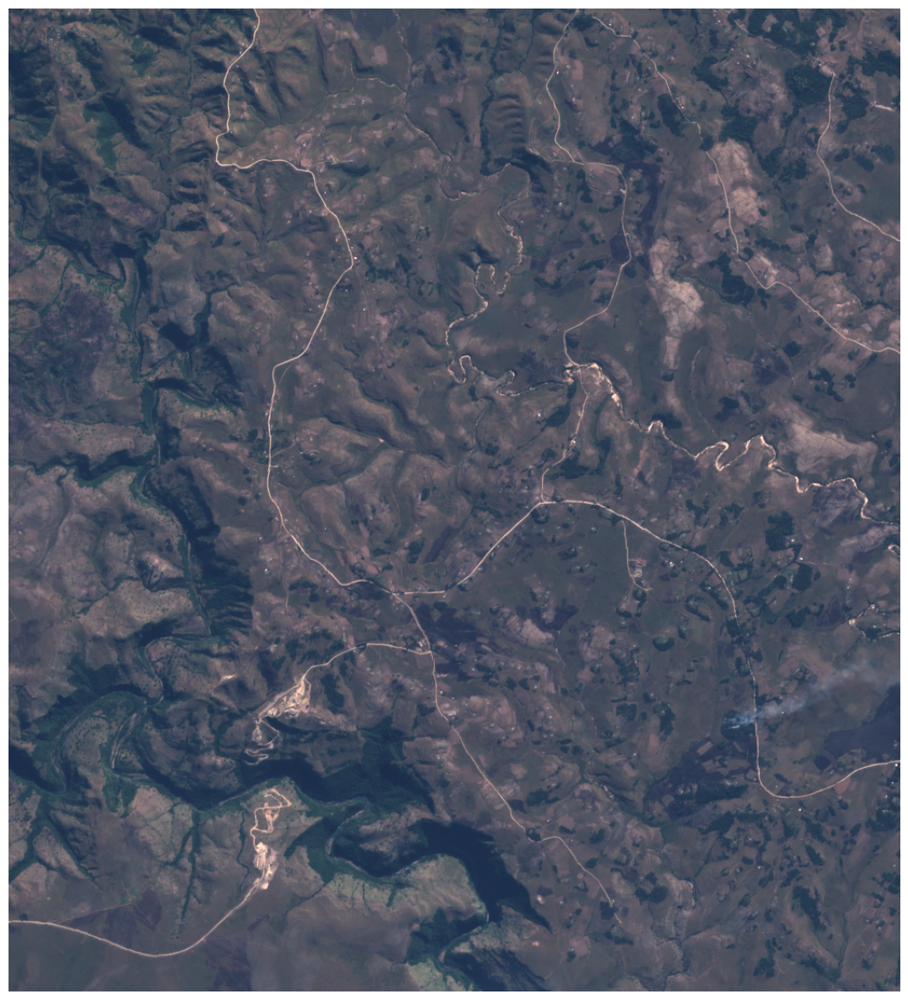

In [16]:
true_color_imgs = request_true_color.get_data()
image = true_color_imgs[0]
print(f"Image type: {image.dtype}")

# plot function
# factor 1/255 to scale between 0-1
# factor 3.5 to increase brightness
plot_image(image, factor=3.5 / 255, clip_range=(0, 1))

In [17]:
start = datetime.datetime(2019, 1, 1)
end = datetime.datetime(2019, 12, 31)
n_chunks = 3
tdelta = (end - start) / n_chunks
edges = [(start + i * tdelta).date().isoformat() for i in range(n_chunks)]
slots = [(edges[i], edges[i + 1]) for i in range(len(edges) - 1)]

print("Monthly time windows:\n")
for slot in slots:
    print(slot)

Monthly time windows:

('2019-01-01', '2019-05-02')
('2019-05-02', '2019-08-31')


In [18]:
def get_true_color_request(time_interval):
    return SentinelHubRequest(
        evalscript=evalscript_true_color,
        input_data=[
            SentinelHubRequest.input_data(
                data_collection=DataCollection.SENTINEL2_L1C.define_from(
                    "s2l1c", service_url=config.sh_base_url
                ),
                time_interval=time_interval,
                mosaicking_order=MosaickingOrder.LEAST_CC,
            )
        ],
        responses=[SentinelHubRequest.output_response("default", MimeType.PNG)],
        bbox=betsiboka_bbox,
        size=betsiboka_size,
        config=config,
    )

In [19]:
# create a list of requests
list_of_requests = [get_true_color_request(slot) for slot in slots]
list_of_requests = [request.download_list[0] for request in list_of_requests]

# download data with multiple threads
data = SentinelHubDownloadClient(config=config).download(
    list_of_requests, max_threads=5
)
# for idx, image in enumerate(data):
#     plt.figure()
#     plt.imshow(np.clip(image * 2.5 / 255, 0, 1))
#     plt.title(f"{slots[idx][0]}  -  {slots[idx][1]}", fontsize=10)

In [20]:
list_of_requests

[DownloadRequest(url='https://sh.dataspace.copernicus.eu/api/v1/process', headers={'content-type': 'application/json', 'accept': 'image/png'}, request_type=<RequestType.POST: 'POST'>, post_values={'input': {'bounds': {'properties': {'crs': 'http://www.opengis.net/def/crs/EPSG/0/4326'}, 'bbox': [29.9, -31.2, 30.0, -31.1]}, 'data': [InputDataDict({'type': 'sentinel-2-l1c', 'dataFilter': {'timeRange': {'from': '2019-01-01T00:00:00Z', 'to': '2019-05-02T23:59:59Z'}, 'mosaickingOrder': 'leastCC'}}, service_url=https://sh.dataspace.copernicus.eu)]}, 'evalscript': '\n    //VERSION=3\n\n    function setup() {\n        return {\n            input: [{\n                bands: ["B02", "B03", "B04"]\n            }],\n            output: {\n                bands: 3\n            }\n        };\n    }\n\n    function evaluatePixel(sample) {\n        return [sample.B04, sample.B03, sample.B02];\n    }\n', 'output': {'responses': [{'identifier': 'default', 'format': {'type': 'image/png'}}], 'width': 983, 

In [21]:
data

[array([[[10, 17, 20],
         [10, 17, 20],
         [11, 17, 20],
         ...,
         [23, 24, 26],
         [24, 24, 27],
         [23, 24, 26]],
 
        [[10, 16, 21],
         [10, 18, 21],
         [12, 18, 21],
         ...,
         [21, 23, 25],
         [24, 24, 27],
         [23, 24, 27]],
 
        [[10, 16, 20],
         [11, 18, 21],
         [12, 19, 21],
         ...,
         [22, 23, 25],
         [22, 23, 25],
         [22, 24, 25]],
 
        ...,
 
        [[15, 20, 22],
         [14, 19, 22],
         [14, 19, 22],
         ...,
         [16, 23, 24],
         [17, 22, 24],
         [18, 23, 25]],
 
        [[15, 20, 23],
         [15, 20, 22],
         [14, 19, 22],
         ...,
         [16, 23, 24],
         [17, 23, 24],
         [19, 23, 25]],
 
        [[15, 20, 22],
         [14, 19, 22],
         [14, 19, 22],
         ...,
         [16, 22, 24],
         [18, 23, 24],
         [18, 23, 24]]], shape=(1084, 983, 3), dtype=uint8),
 array([[[18, 20, 25

## 2.2 bach process

In [40]:
evalscript_true_color = """
        //VERSION=3
        function setup() {
            return {
                input: [{
                    bands: ["B02", "B03", "B04"],
                    units: "DN"
                }],
                output: {
                    bands: 3
                }
            };
        }

        function evaluatePixel(sample) {
            return [sample.B04, sample.B03, sample.B02];
        }
    """

In [ ]:
def get_true_color_request(time_interval,area_bbox, area_size,evalscript_true_color):
    return SentinelHubRequest(
        evalscript=evalscript_true_color,
        input_data=[
            SentinelHubRequest.input_data(
                data_collection=DataCollection.SENTINEL2_L1C.define_from(
                    "s2l1c", service_url=config.sh_base_url
                ),
                time_interval=time_interval,
                mosaicking_order=MosaickingOrder.LEAST_CC,
            )
        ],
        responses=[SentinelHubRequest.output_response("default", MimeType.PNG)],
        bbox=area_bbox,
        size=area_size,
        config=config,
    )

In [ ]:
def extract_images(all_df, output_dir, config, start_date, end_date, d=0.1, res=10, n_chunks=10):
    """
    Extract Sentinel images with time series data
    
    Args:
        all_df: DataFrame with archaeological points
        output_dir: Output directory for images
        config: Sentinel Hub configuration
        start_date: Start date as string "YYYY-MM-DD" 
        end_date: End date as string "YYYY-MM-DD"
        d: Buffer distance in degrees
        res: Resolution in meters
        n_chunks: Number of time chunks
    """
    # Convert dates and create time slots
    start = datetime.datetime.strptime(start_date, "%Y-%m-%d")
    end = datetime.datetime.strptime(end_date, "%Y-%m-%d")
    tdelta = (end - start) / n_chunks
    edges = [(start + i * tdelta).date().isoformat() for i in range(n_chunks)]
    slots = [(edges[i], edges[i + 1]) for i in range(len(edges) - 1)]
    
    # Create a list to store image metadata
    image_description = []
    
    
    # Process each point
    for idx, row in all_df.iterrows():
        area_bbox = BBox(bbox=(row['longitude'] - d, row['latitude'] - d,row['longitude'] + d, row['latitude'] + d), crs=CRS.WGS84)
        area_size, adjusted_resolution = get_safe_dimensions(area_bbox, initial_resolution=res)
        # area_bbox = BBox(bbox=(46.16, -16.15, 46.51, -15.58), crs=CRS.WGS84)
        area_size = bbox_to_dimensions(area_bbox, resolution=adjusted_resolution)
        print(area_bbox, area_size, adjusted_resolution)    
        list_of_requests = [get_true_color_request(slot,area_bbox, area_size) for slot in slots]
        list_of_requests = [request.download_list[0] for request in list_of_requests]
        data = SentinelHubDownloadClient(config=config).download(list_of_requests, max_threads=5)
        
        for idx, image in enumerate(data):
            image_data=np.clip(image * 2.5 / 255, 0, 1)
            plt.figure()
            plt.imshow(np.clip(image * 2.5 / 255, 0, 1))
            output_path = os.path.join(output_dir, f"id_{row['id']}_{slots[idx][0]}-{slots[idx][1]}.png")
            plt.imsave(output_path, image_data)   
                    # Store metadata
            image_description.append({
                'id': row['id'],
                'name': row['name'],
                'latitude': row['latitude'],
                'longitude': row['longitude'],
                'start_date': {slots[idx][0]},
                'end_date': {slots[idx][1]},
                'source': row['source'],
                'resolution': res,
                'buffer_distance': d,
                'image_size': image.shape,
                'image_path': output_path
            })


/var/folders/hd/xyp1w1g908qdh5rcmj8qb8nh0000gn/T/ipykernel_20889/2948282063.py:65: SHDeprecationWarning: The string representation of `BBox` will change to match its `repr` representation.
  print(area_bbox, area_size, adjusted_resolution)


31.00246145015321,29.69502799992025,31.402461450153208,30.095027999920248 (655, 729) 60


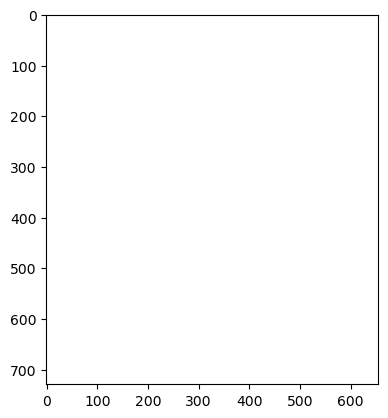

In [31]:
# Example usage - process one year of data in monthly chunks
out_path= Path("./ground_truth_images")
if not out_path.exists():
    out_path.mkdir(parents=True)
extract_images(all_df[:1], out_path,  config, "2019-01-01",  "2020-03-31",  d=0.2, res=60, n_chunks=2)
